In [1]:
# Manipulation d'images

In [2]:
# Une image est un tenseur hauteur × largeur × canaux. En fonction
# de la bibliothèque utilisée, l'image peut se coder channel-first
# ou channel-last. Il existe plusieurs espaces colorimétriques :
# - RGB : couleurs sur un intervalle [0;255] sauf si normalisé.
# - HSL (Hue, saturation, lightness)
# - HSV (Hue, saturation, value)
# - Cielab : espace colorimétrique fait pour être perceptuellement
# uniforme.

In [3]:
# Le slicing

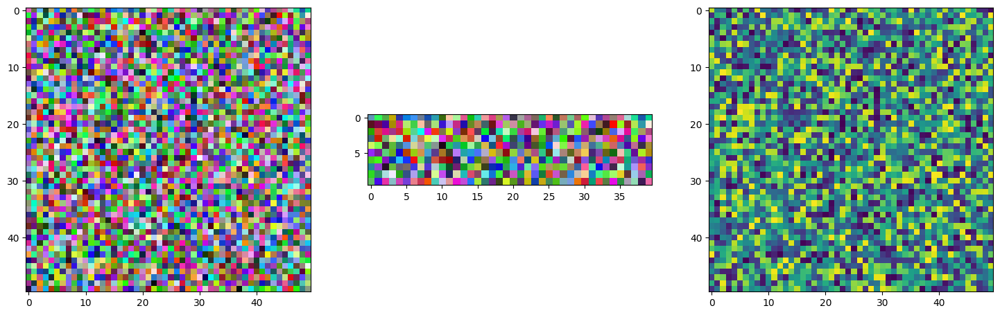

In [4]:
# La syntaxe est la suivante :
# sequence[start:stop(exclu):step]
# Si un chiffre est négatif, on commence par la fin :
# sequence[-3:] -> 3 derniers éléments.
# Sur un tenseur, il faut séparer les dimensions par une virgule :
# tenseur[:, :, :] -> sélection de tous les éléments d'un tenseur.

# Exemples :
import matplotlib.pyplot as plt
from numpy.random import randint
import numpy as np

# Création d'un tableau de valeurs aléatoires, comprises entre 0 et 
# 256 exclus, de taille 50×50, avec 3 canaux.
img = randint(0, 256, (50, 50, 3), dtype=np.uint8)

crop = img[:10, 10:, :]

red = img[:, :, 0]

plt.figure(figsize=(18, 6))
# subplot fonctionne de la manière suivante : lignes, colonnes, place
plt.subplot(131)
plt.imshow(img)
plt.subplot(132)
plt.imshow(crop)
plt.subplot(133)
plt.imshow(red)

In [5]:
# Annotation

In [6]:
# Les types courants d'annotation :
# Classification : attribuer une étiquette
# Détection d'objets : Dessiner des boîtes englobantes
# Segmentation : Créer des masques
# Points clés : marquer des points spécifiques de l'image

# L'annotation est essentielle pour entraîner des modèles
# de vision par ordinateur.

In [7]:
# Convolution

In [8]:
# La convolution est une opération mathématique qui applique un 
# filtre sur une image.
# Padding : Le padding est un paramètre permettant de rajouter
# des 0 au signal d'origine pour compenser la réduction de taille.
# Stride : Le pas permet de modifier le # de positions pour lesquelles
# le filtre se déplace.

# Avec Pytorch
from torch import randn
from torch.nn import Conv2d

img = randn(1, 3, 64, 64) # 1 image, 3 channels, 64×64 pixels

conv = Conv2d(in_channels=3, out_channels=8, kernel_size=3, stride=1, padding=1)

output = conv(img)

print(img.shape, '\n', output.shape)

torch.Size([1, 3, 64, 64]) 
 torch.Size([1, 8, 64, 64])


In [9]:
# Exercice 1

(1440, 1920, 4)


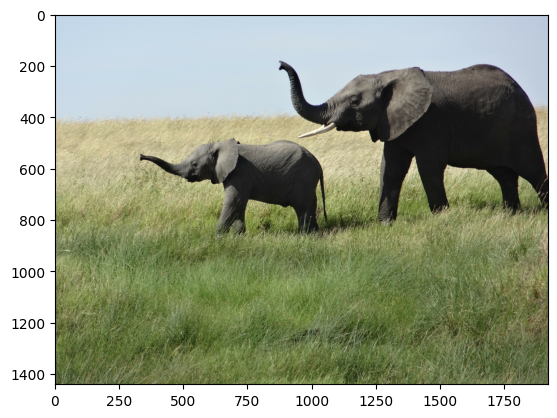

In [10]:
import matplotlib.pyplot as plt
from matplotlib.image import imread

img = imread('./src/elephants.png')

# L'image se compose de 1440 pixels de haut, 1920 pxiels de large et 4
# canaux de couleurs, c'est donc une image en RGBA.
print(img.shape)

plt.imshow(img)

In [11]:
# Ewercice 2

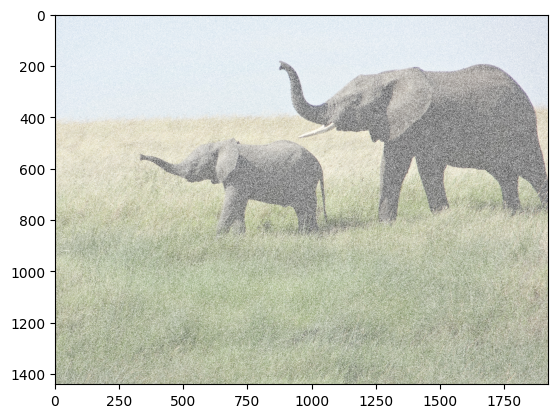

In [12]:
import numpy as np

img_alpha = img[...] * 0.5

img_rand = img

img_rand[..., 3] = np.random.rand(img.shape[0], img.shape[1])
plt.imshow(img_rand)

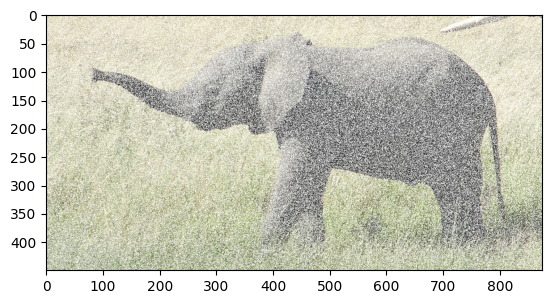

In [13]:
bebe = img[450:900, 250:1125, :]
plt.imshow(bebe)

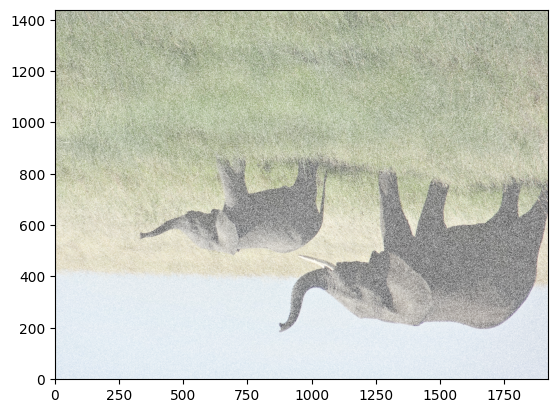

In [14]:
plt.imshow(img, origin='lower')

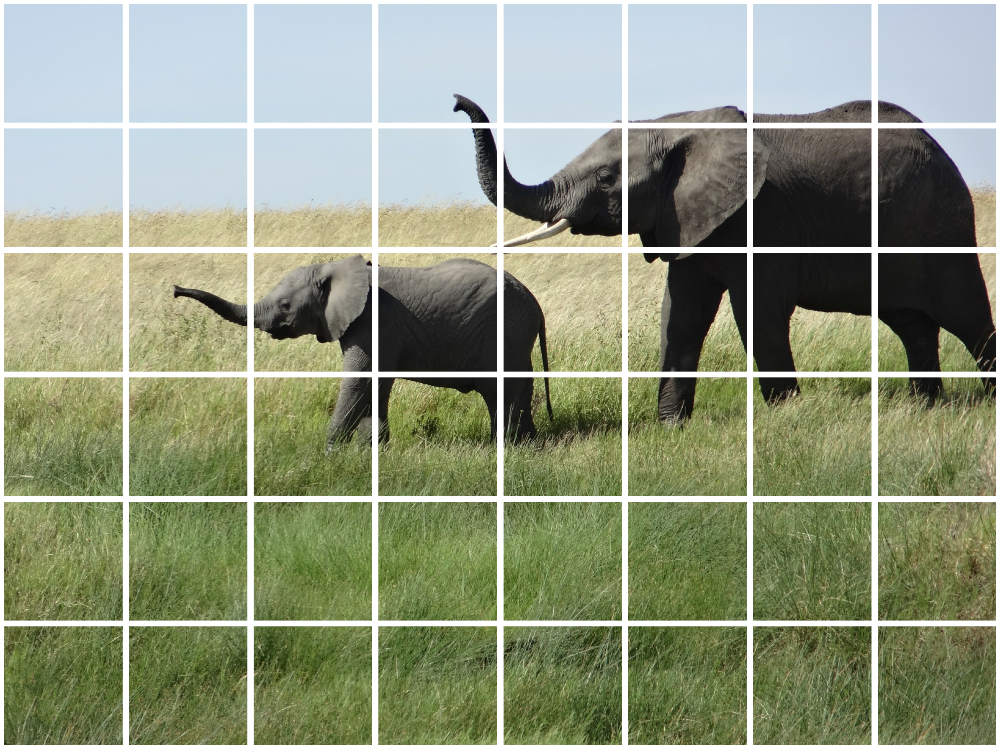

In [15]:
img = imread('./src/elephants.png')

h, w = img.shape[:2]
n_h, n_w = (h+239)//240, (w+239)//240

patches = [img[i:i+240, j:j+240] for i in range(0, h, 240) for j in range(0, w, 240)]

fig, axes = plt.subplots(n_h, n_w, figsize=(n_w*3, n_h*3))

for ax, patch in zip(axes.flat, patches):
    ax.imshow(patch.astype('f4')/255 if patch.dtype==np.uint8 else patch)
    ax.axis('off')
plt.tight_layout()

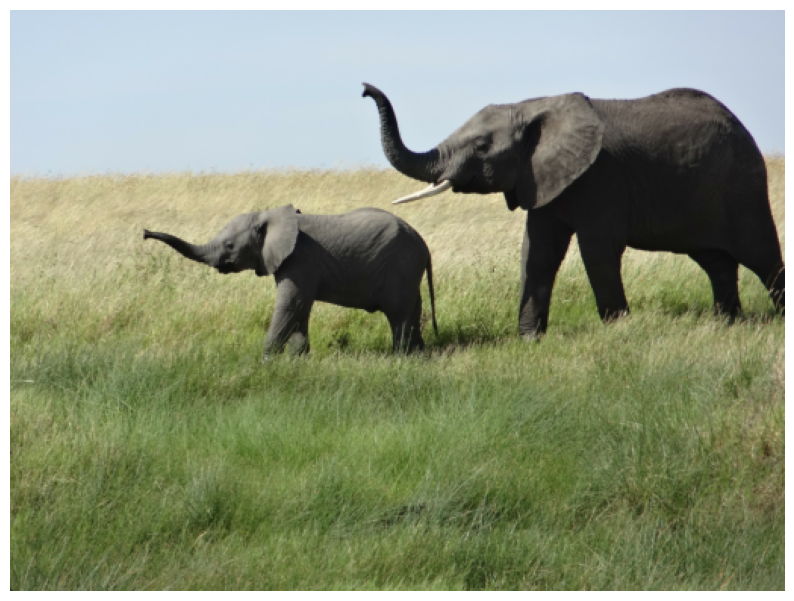

In [37]:
from skimage.transform import resize

small_patches = []
for patch in patches:
    small = resize(patch, (64, 64, 4), anti_aliasing=True)
    small_patches.append(small)

reconstructed = np.zeros((n_h*64, n_w*64, 3 if len(img.shape)==3 else 1))

k = 0
for i in range(n_h):
    for j in range(n_w):
        reconstructed[i*64:(i+1)*64, j*64:(j+1)*64, :] = small_patches[k][..., :3]
        k += 1

plt.figure(figsize=(10, 8))
plt.imshow(reconstructed.astype('float32') if reconstructed.dtype != np.uint8 else reconstructed/255)
plt.axis('off')
plt.show()

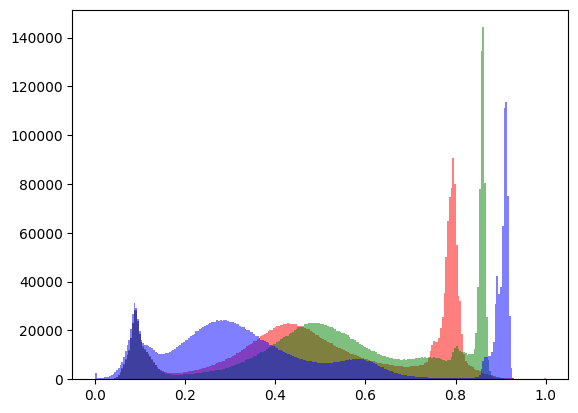

In [16]:
c = ['red', 'green', 'blue']

for i in range(3):
  plt.hist(img[..., i].ravel(), bins=256, color=c[i], alpha=0.5)
plt.show()

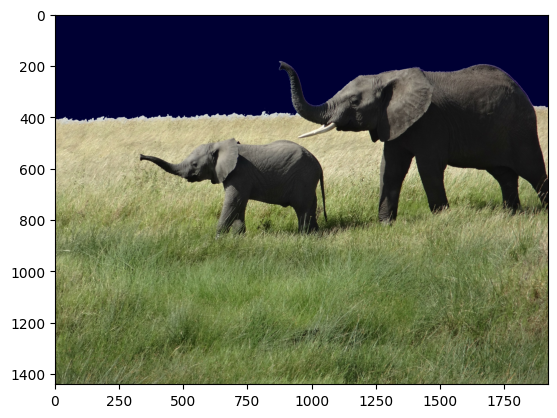

In [18]:
img = plt.imread('./src/elephants.png')

ciel = np.all(img[..., :3] > 0.5, axis=-1) & (img[..., 2] > img[..., 0]) & (img[..., 2] > img[..., 1])

img_nuit = img
img_nuit[ciel] = [0, 0, 0.2, 1]
plt.imshow(img_nuit)

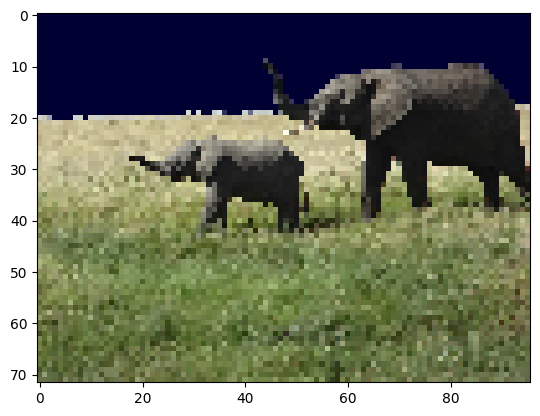

In [27]:
import cv2

hauteur, largeur = 1440, 1920
img_scaled = cv2.resize(img, (96, 72), interpolation=cv2.INTER_LINEAR)
plt.imshow(img_scaled)

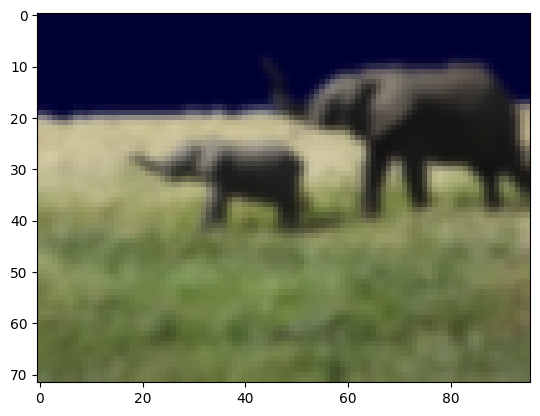

In [31]:
img_smoothed = cv2.GaussianBlur(img_scaled, ksize=(5, 5), sigmaX=1, sigmaY=1)
plt.imshow(img_smoothed)